### Integrantes  
Claucich, Estanislao  
Garay, Ramiro  
Gorostidi, Axel

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

import PDI.filtros.frecuencia as freq
import PDI.filtros.espacial as espc
import PDI.utils.utils as utils
import PDI.color.color as color
import PDI.histograma.histo as histo

**Se considera el siguiente problema:**  

Se tiene un conjunto de imágenes de portadas de distintos libros, que fueron obtenidas con distintas fuentes de luz, y donde se busca tratar de corregir la iluminación de cada una. El objetivo es, para las imágenes que posean una pobre iluminación, recuperar información relevante del libro, ya sea título, autor, u otros detalles donde sea posible.

Principalmente se trabajará sobre el espacio **HSV** de las imágenes, para disminuir las alteraciones sobre los colores de las mismas.  

Se llevarán a cabo transformaciones en el dominio espacial y frecuencial donde sea necesario, y se evaluarán los distintos métodos (y secuencia de los mismos) para imágenes con distinta iluminación.

### Cargamos las imágenes y las mostramos

In [2]:
import glob

filenames = [img for img in glob.glob("./Imagenes/*.jpg")]

In [3]:
images = [cv.imread(img) for img in filenames]

In [4]:
for i,img in enumerate(images):
    images[i] = cv.cvtColor(img, cv.COLOR_BGR2RGB)

Como se observa, la iluminación presente en las distintas imágenes es muy variada y, en ciertos casos, esto lleva a que se pierdan elementos importantes de la misma.  
En el siguiente trabajo, nos centraremos en investigar estos casos extremos, ya que son los que presentan una problemática más interesante a resolver.

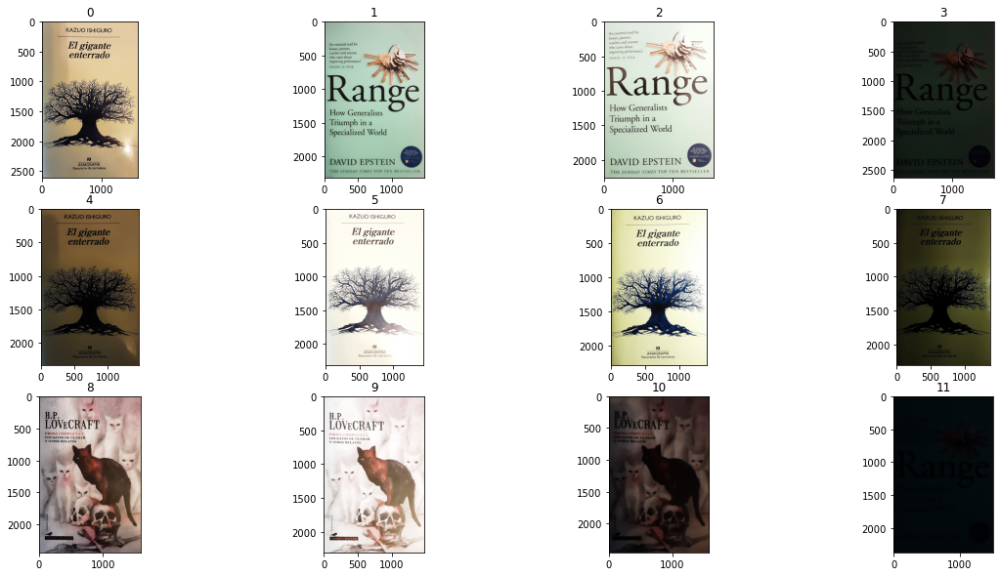

In [5]:
utils.plot(images, figsize=(20,10), patron=(3,4), titulos=['0','1','2','3','4','5','6','7','8','9','10','11'])

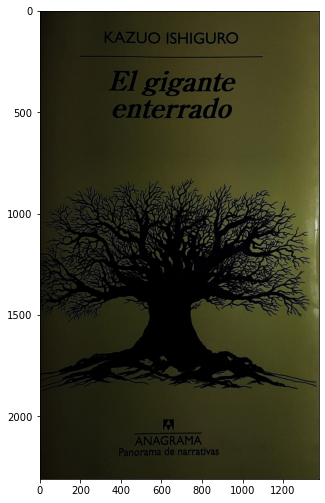

In [6]:
img = images[7]
plt.figure(figsize=(5,10))
plt.imshow(img);

### 1. CANALES HSV

Lo primero que realizamos es convertir la imagen al espacio **HSV** ya que trabajaremos sobre el mismo.

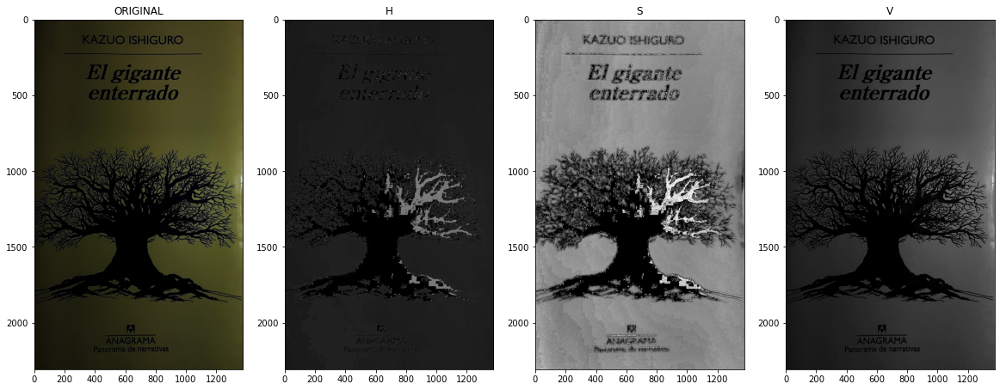

In [7]:
color.plot_color_channels(img, space='hsv')

In [8]:
channels_hsv = cv.split(color.RGB2HSV(img))

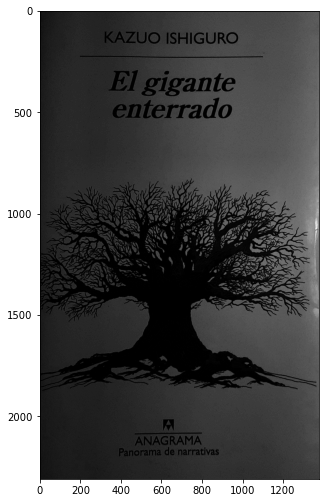

In [9]:
channel_v = channels_hsv[2]
plt.figure(figsize=(5,10))
plt.imshow(channel_v, cmap='gray')

### 2.1. ECUALIZADO DEL CANAL V

Vemos el resultado de aplicar una ecualización global y local al canal **V** de la imagen original.   

Para el primer caso, se ve que se consigue mejorar el contraste de la imagen, y dependiendo de lo que se busque como resultado, esto puede ser una restauración óptima, haciendo más visibles ciertos elementos que antes estaban casi ocultos.

Para el caso de la ecualziación local se observa que, a pesar de que logra mejorar de cierta manera el contraste de la imagen, genera un efecto de *quemado* sobre la misma, probablemente debido a la alta concentración de energía sobre una pequeña zona del histograma, lo que lleva a que la ecualización no sea muy buena.

In [10]:
channel_v_eqg = histo.eq_global(channel_v)
channel_v_eql = histo.eq_local(channel_v)

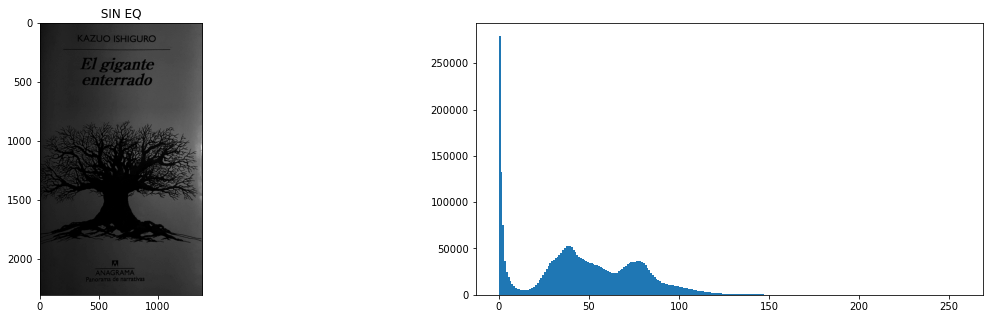

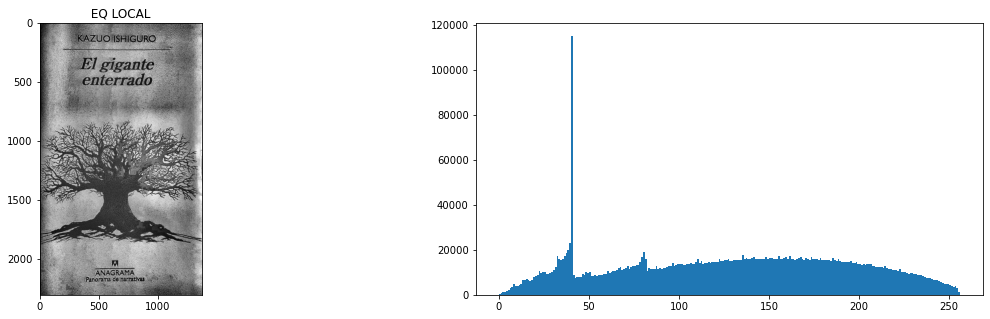

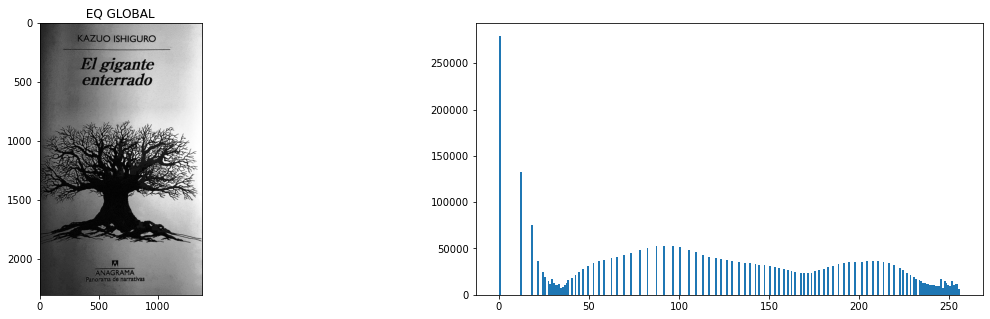

In [11]:
histo.plot_histo([channel_v], figsize=(20,5), patron=(1,2), titulos=[' SIN EQ ', ''])
histo.plot_histo([channel_v], eq='local', figsize=(20,5), patron=(1,2), titulos=[' EQ LOCAL ', ''])
histo.plot_histo([channel_v], eq='global', figsize=(20,5), patron=(1,2), titulos=[' EQ GLOBAL ', ''])

### 2.2. FILTRADO HOMOMORFICO

Como lo que se busca es modificar principalmente la iluminación de la imagen, el filtro que más control nos da sobre esta característica es el filtro homomórfico, donde podremos afectar de manera distinta a las bajas frecuencias (iluminancia) que a las altas frecuencias (reflectancia).

Algo a tener en cuenta es que, cada proceso o técnica utilizada va a ser dependiente de diferentes factores, tanto como el propio objetivo que es espera alcanzar como resultado, la iluminación de la imagen, la complejidad de la misma, entre otros. Por lo tanto, los parámetros, o inlcuso el uso de algunas técnicas, irá variando de imagen a imagen. 

In [12]:
import ipywidgets as widgets
from ipywidgets import interact

In [13]:
def update_hm(low,high,fc,n):
    channel_v_hm, filtro_hm = freq.aplicar_homomorfico(channel_v, low, high, fc, n)
    
    channel_v_hm = channel_v_hm.astype('uint8')
    filtro_hm = filtro_hm.astype('uint8')
    
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    plt.title('ESPECTRO DEL FILTRO')
    plt.imshow(filtro_hm, cmap='gray')
    
    plt.subplot(1,3,2)
    plt.title('FUNCIÓN DE TRANSFERENCIA')
    H = low + ((high-low) / (1 + (fc/np.arange(1,256))**(2*n)))
    plt.plot(np.arange(255), H);

    plt.subplot(1,3,3)
    plt.title('RESULTADO')
    plt.imshow(channel_v_hm, cmap='gray')

interact(update_hm,
        low=widgets.FloatSlider(min=-20, max=50, step=1, value=4),
        high=widgets.FloatSlider(min=-20, max=20, step=1, value=1.5),
        fc=widgets.IntSlider(min=0, max=255, step=1, value=60),
        n=widgets.IntSlider(min=0, max=10, step=1, value=1)
    );

interactive(children=(FloatSlider(value=4.0, description='low', max=50.0, min=-20.0, step=1.0), FloatSlider(va…

In [14]:
channel_v_hm, filtro_hm = freq.aplicar_homomorfico(channel_v, 4,1.5,60,1)

Como se puede observar, para este caso en particular, existe un cierto filtro homomórfico que consigue una ilumininación uniforme en toda la imagen.  
La gran desventaja de este proceso, es la clara inclusión del ruido en la imagen. Nuevamente un efecto que se puede corresponder a la alta energía concetrada en un pequeño punto en el histograma de la imagen. 

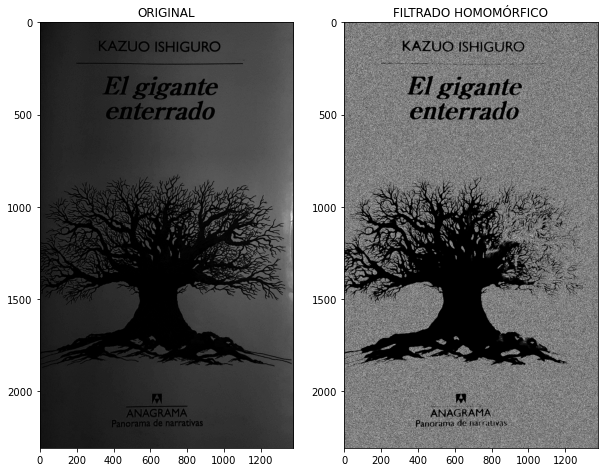

In [15]:
utils.plot([channel_v, channel_v_hm], figsize=(10,10), patron=(1,2), titulos=['ORIGINAL', 'FILTRADO HOMOMÓRFICO'])

### 3. ECUALIZADO LOCAL Y GLOBAL DEL FILTRO HOMOMÓRFICO

Nuevamente, se observa el efecto de realizar una ecualización global y local, pero en este caso, a la imagen con el filtrado homomórfico.  
Como se mencionó anteriormente, con el filtro aplicado, se consiguió una iluminación uniforme con un buen nivel de contraste, es por esto, que ambas ecualizaciones no presentan cambios considerables sobre la imagen. Este fenómeno se observa claramente en los histogramas siguientes, donde se ve que, ignorando el pico de energía presente, la imagen ya posee un alto rango dinámico.

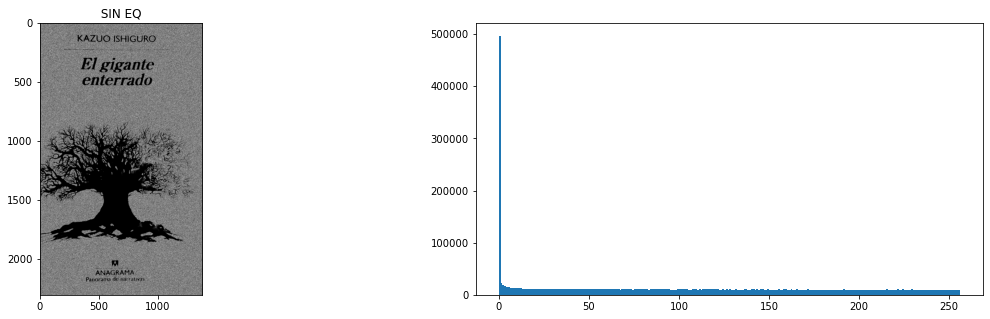

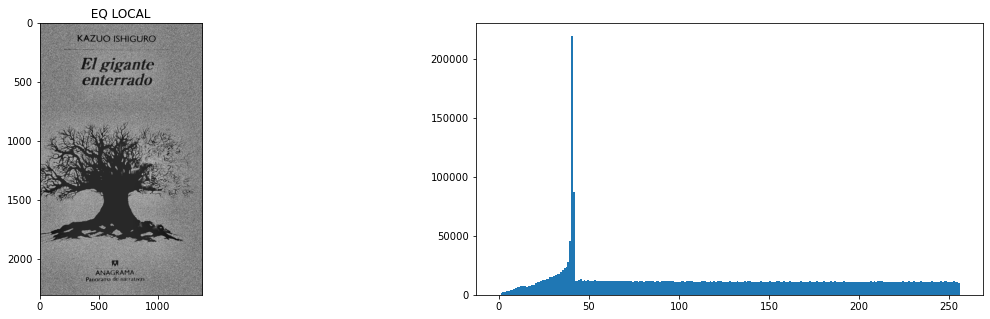

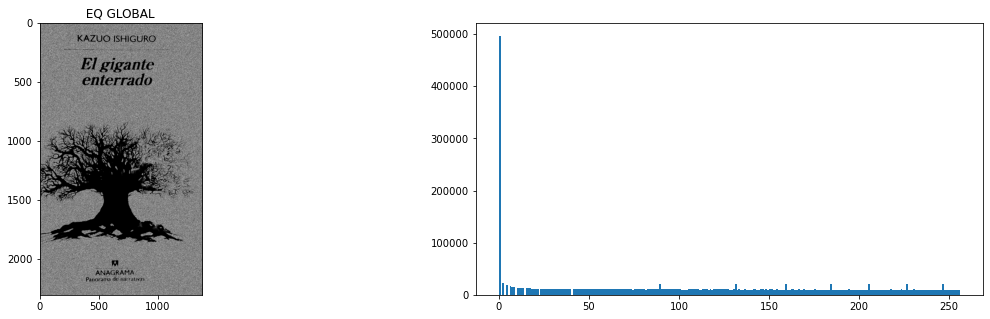

In [16]:
histo.plot_histo([channel_v_hm], figsize=(20,5), patron=(1,2), titulos=[' SIN EQ ', ''])
histo.plot_histo([channel_v_hm], eq='local', figsize=(20,5), patron=(1,2), titulos=[' EQ LOCAL ', ''])
histo.plot_histo([channel_v_hm], eq='global', figsize=(20,5), patron=(1,2), titulos=[' EQ GLOBAL ', ''])

In [17]:
channel_v_hm_eqg = histo.eq_global(channel_v_hm)
channel_v_hm_eql = histo.eq_local(channel_v_hm)

A continuación, se presentan todos los resultados obtenidos hasta el momento para la imagen en cuestión. Viendo cómo influyen los cambios realizados en el canal **V** al volver al espacio **RGB**.

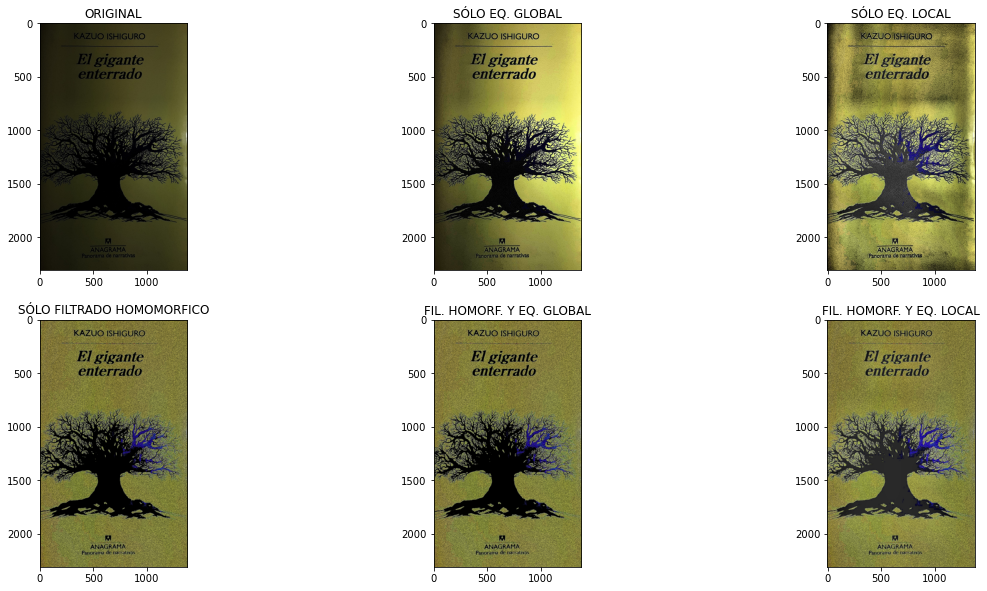

In [18]:
#eq global
res_rgb_eqg = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_eqg]))

#eq local
res_rgb_eql = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_eql]))

#filtrado
res_rgb_hm = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm.astype('uint8')]))

#filtrado y eq global
res_rgb_hm_eqg = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm_eqg]))

#filtrado y eq local
res_rgb_hm_eql = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm_eql]))

utils.plot([img, res_rgb_eqg, res_rgb_eql, res_rgb_hm, res_rgb_hm_eqg, res_rgb_hm_eql], figsize=(20,10), patron=(2,3), gray=False, 
           titulos=['ORIGINAL', 'SÓLO EQ. GLOBAL', 'SÓLO EQ. LOCAL', 
                    'SÓLO FILTRADO HOMOMORFICO', 'FIL. HOMORF. Y EQ. GLOBAL', 'FIL. HOMORF. Y EQ. LOCAL'])

### 4. TRANSFORMACIONES

Los resultados más prometedores son los obtenidos por el filtrado homomórfico y la ecualización global.  
A continuación se utilzará una transformación en potencia sobre el canal **V** para tratar de realizar una corrección gamma del mismo.

In [19]:
def update_t(gamma, c):
    t = utils.t_pot(gamma, c)
    
    plt.figure(figsize=(20,5))
    
    plt.subplot(1,3,1)
    plt.title('SIN CORRECION GAMMA')
    plt.imshow(channel_v_hm_eqg.astype('uint8'), cmap='gray')
    
    plt.subplot(1,3,2)
    plt.title('TRANSF. GAMMA')
    plt.plot(np.arange(255), t[np.arange(255)])
    
    plt.subplot(1,3,3)
    plt.title('CON CORRECION GAMMA')
    plt.imshow(t[channel_v_hm_eqg].astype('uint8'), cmap='gray')
    
interact(update_t, 
         gamma=widgets.FloatSlider(min=0, max=10, step=.1, value=.5),
         c=widgets.FloatSlider(min=0, max=10, step=.1, value=.3)
    );

interactive(children=(FloatSlider(value=0.5, description='gamma', max=10.0), FloatSlider(value=0.3, descriptio…

In [20]:
t_gamma = utils.t_pot(.5, .3)
channel_v_hm_eqg_gamma = t_gamma[channel_v_hm_eqg]
channel_v_hm_eqg_gamma /= np.max(channel_v_hm_eqg_gamma)
channel_v_hm_eqg_gamma *= 255

In [21]:
def update_t(gamma, c):
    t = utils.t_pot(gamma, c)
    
    plt.figure(figsize=(20,5))
    
    plt.subplot(1,3,1)
    plt.title('SIN CORRECION GAMMA')
    plt.imshow(channel_v_eqg.astype('uint8'), cmap='gray')
    
    plt.subplot(1,3,2)
    plt.title('TRANSF. GAMMA')
    plt.plot(np.arange(255), t[np.arange(255)])
    
    plt.subplot(1,3,3)
    plt.title('CON CORRECION GAMMA')
    plt.imshow(t[channel_v_eqg].astype('uint8'), cmap='gray')
    
interact(update_t, 
         gamma=widgets.FloatSlider(min=0, max=10, step=.1, value=.5),
         c=widgets.FloatSlider(min=0, max=10, step=.1, value=.3)
    );

interactive(children=(FloatSlider(value=0.5, description='gamma', max=10.0), FloatSlider(value=0.3, descriptio…

In [22]:
t_gamma = utils.t_pot(.4, 1.2)
channel_v_eqg_gamma = t_gamma[channel_v_eqg]
channel_v_eqg_gamma /= np.max(channel_v_eqg_gamma)
channel_v_eqg_gamma *= 255

En las siguientes imágenes e ven los resultados obtenidos por la aplicación de la transformación en potencia.

El resultado, para ambos casos, es mejor del que se tenía antes de utilizar la transformación. Nuevamente, decidir cuál de los dos presenta mejores resultados, dependerá de lo que esperamos como resultado. 

Para el caso de no usar el filtrado homomórfico, se obtuvo una mejor representación del color y d la textura de la imagen original, sin embargo, la iluminación no es completamente uniforme. 

En el caso de aplicar el filtro homomórfico, sí se consigue esta iluminación uniforme, pero la representación del color no es del todo realista.

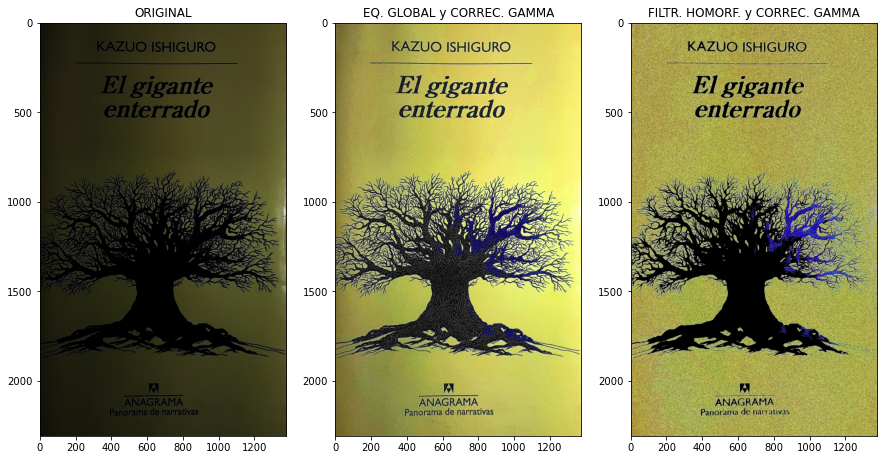

In [23]:
#filtrado, eq gobal y gamma
res_rgb_hm_eqg_gamma = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm_eqg_gamma.astype('uint8')]))

#eq global y gamma
res_rgb_eqg_gamma = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_eqg_gamma.astype('uint8')]))

utils.plot([img, res_rgb_eqg_gamma, res_rgb_hm_eqg_gamma], 
           figsize=(15,15), patron=(1,3), gray=False, 
           titulos=['ORIGINAL', 'EQ. GLOBAL y CORREC. GAMMA', 'FILTR. HOMORF. y CORREC. GAMMA'])

### 5. Umbralizado Adaptativo

Se comparan los resultados obtenidos anteriormente con el uso de la técnica de filtrado adaptativo para la normalización de la iluminación en la imagen.  
La técnica se aplica sobre el canal **V** de la imagen sin ningún procesamiento previo.

In [24]:
_,th1 = cv.threshold(channel_v,40,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(channel_v,255,cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY,5,1)
th3 = cv.adaptiveThreshold(channel_v,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY,5,1)

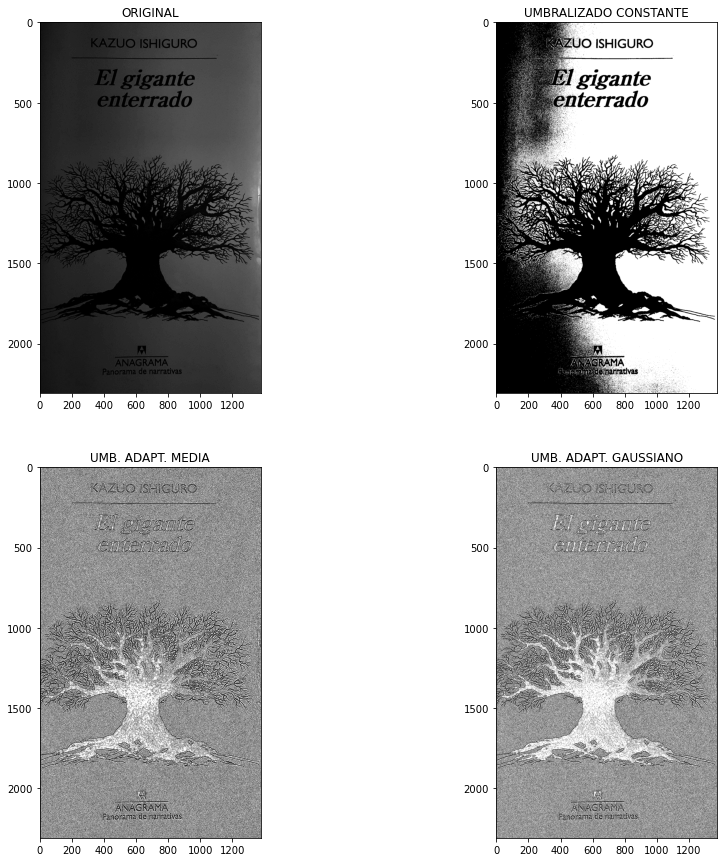

In [25]:
utils.plot([channel_v, th1, th2, th3], patron=(2,2), figsize=(15,15), 
          titulos=['ORIGINAL', 'UMBRALIZADO CONSTANTE', 'UMB. ADAPT. MEDIA', 'UMB. ADAPT. GAUSSIANO'])

Como se mencionó anteriormente, y al igual que para cualquier otra técnica, el uso de la misma dependerá del resultado que se busca obtener.  
En este caso, en relación con alcanzar una iluminación uniforme, el umbralizado adaptativo lo consigue sin problemas pero, como se puede ver en las imágenes siguientes, no consigue buenos resultados en la recuperación de color.  
El umbralizado constante, presenta la clara desventaja de que no se tiene un buen control sobre la normalización de la iluminación, pero presenta mejores resultados en cuanto a recuperación de color se refiere.

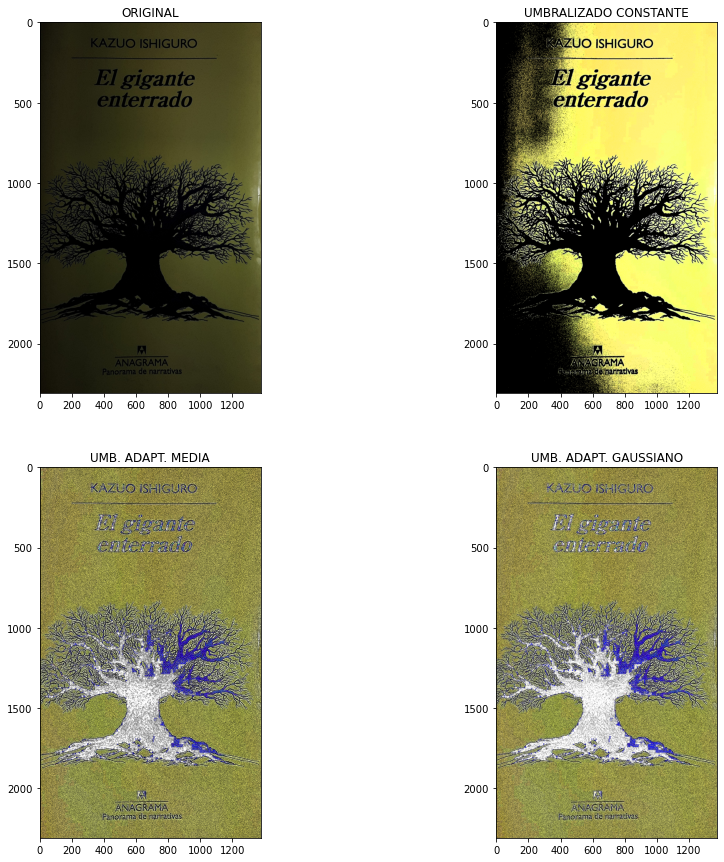

In [26]:
res_rgb_th1 = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], th1.astype('uint8')]))

res_rgb_th2 = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], th2.astype('uint8')]))

res_rgb_th3 = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], th3.astype('uint8')]))

utils.plot([img, res_rgb_th1, res_rgb_th2, res_rgb_th3], 
           figsize=(15,15), patron=(2,2), gray=False,
          titulos=['ORIGINAL', 'UMBRALIZADO CONSTANTE', 'UMB. ADAPT. MEDIA', 'UMB. ADAPT. GAUSSIANO'])

Ahora veamos el caso para imagen en condiciones totalmente diferentes.

En este caso, se tiene una imagen que se encuentra sobresaturada, y donde se puede ver claramente la fuente de luz presente en la esquina inferior derecha de la imagen.

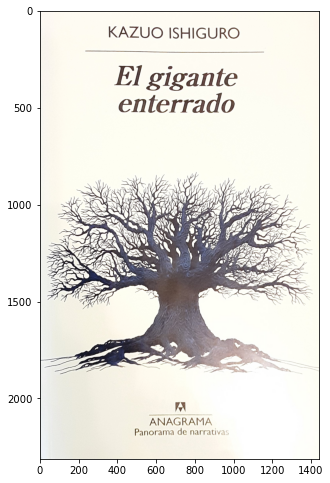

In [27]:
img = images[5]
plt.figure(figsize=(5,10))
plt.imshow(img);

Se procede de manera similar a la imagen anterior. Viendo en primer lugar la información contenida en los canales **HSV**

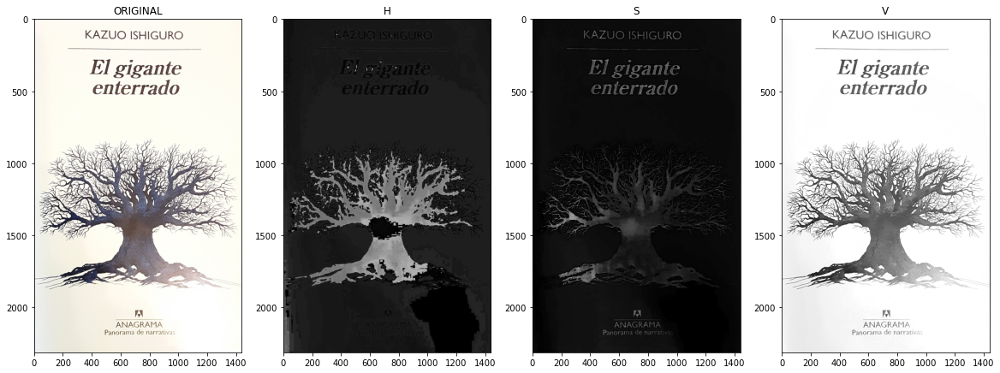

In [28]:
color.plot_color_channels(img, space='hsv')

In [29]:
channels_hsv = cv.split(color.RGB2HSV(img))

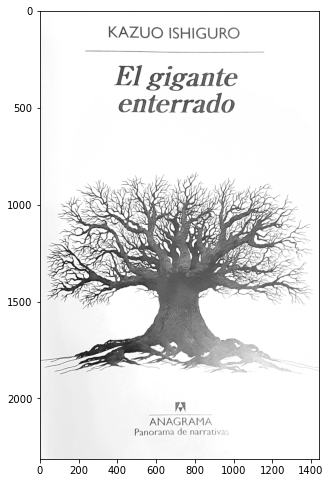

In [30]:
channel_v = channels_hsv[2]
plt.figure(figsize=(5,10))
plt.imshow(channel_v, cmap='gray')

Para esta imagen se ve aún más acentuado el efecto no deseado en la ecualización de la imagen producido por la concentración de la energía en una pequeña zona del histograma.  
Esto hace que las ecualizaciones para esta iamgen no sean una técnica muy útil.

In [31]:
channel_v_eqg = histo.eq_global(channel_v)
channel_v_eql = histo.eq_local(channel_v)

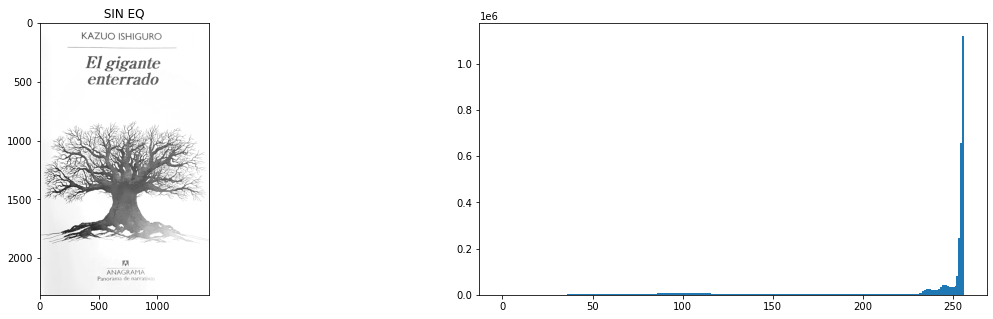

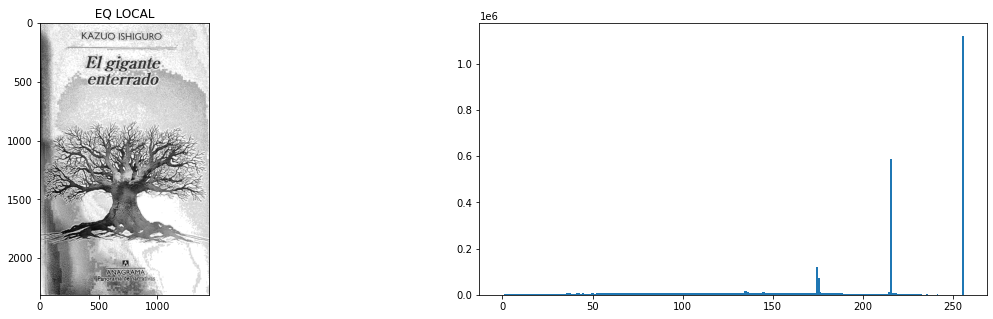

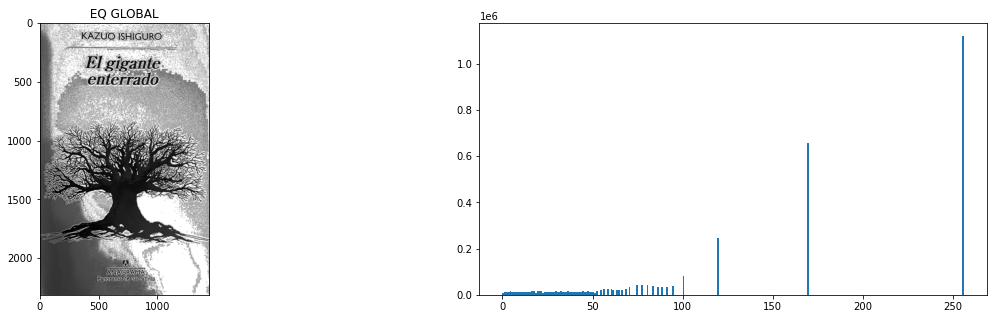

In [32]:
histo.plot_histo([channel_v], figsize=(20,5), patron=(1,2), titulos=[' SIN EQ ', ''])
histo.plot_histo([channel_v], eq='local', figsize=(20,5), patron=(1,2), titulos=[' EQ LOCAL ', ''])
histo.plot_histo([channel_v], eq='global', figsize=(20,5), patron=(1,2), titulos=[' EQ GLOBAL ', ''])

In [33]:
def update_hm(low,high,fc,n):
    channel_v_hm, filtro_hm = freq.aplicar_homomorfico(channel_v, low, high, fc, n)
    
    channel_v_hm = channel_v_hm.astype('uint8')
    filtro_hm = filtro_hm.astype('uint8')
    
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    plt.imshow(filtro_hm, cmap='gray')
    
    plt.subplot(1,3,2)
    H = low + ((high-low) / (1 + (fc/np.arange(1,256))**(2*n)))
    plt.plot(np.arange(255), H);

    plt.subplot(1,3,3)
    plt.imshow(channel_v_hm.astype('uint8'), cmap='gray', vmin=0, vmax=255)

interact(update_hm,
        low=widgets.FloatSlider(min=-20, max=50, step=1, value=.8),
        high=widgets.FloatSlider(min=-20, max=20, step=1, value=1.0),
        fc=widgets.IntSlider(min=0, max=255, step=1, value=120),
        n=widgets.IntSlider(min=0, max=10, step=1, value=1)
    );

interactive(children=(FloatSlider(value=0.8, description='low', max=50.0, min=-20.0, step=1.0), FloatSlider(va…

In [34]:
channel_v_hm, filtro_hm = freq.aplicar_homomorfico(channel_v, .9, 2.0, 240, 1)

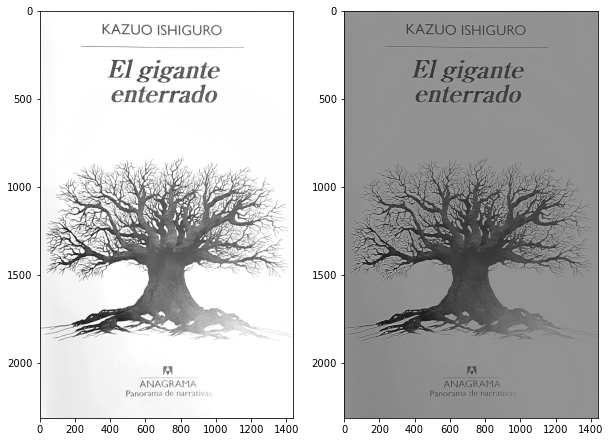

In [35]:
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(channel_v, cmap='gray')
plt.subplot(1,2,2)
plt.imshow(channel_v_hm.astype('uint8'), cmap='gray')

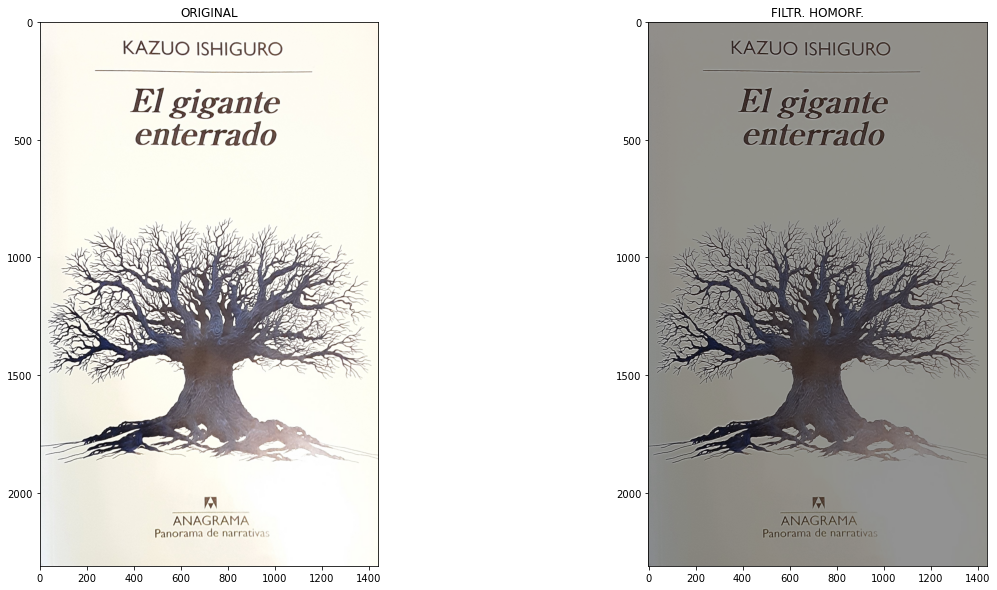

In [36]:
#filtrado
res_rgb_hm = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm.astype('uint8')]))

utils.plot([img, res_rgb_hm], figsize=(20,10), patron=(1,2), gray=False, 
           titulos=['ORIGINAL', 'FILTR. HOMORF.']);

In [37]:
def update_t(gamma, c):
    t = utils.t_pot(gamma, c)
    
    plt.figure(figsize=(20,5))
    
    plt.subplot(1,3,1)
    plt.title('SIN CORRECION GAMMA')
    plt.imshow(channel_v_hm.astype('uint8'), cmap='gray')
    
    plt.subplot(1,3,2)
    plt.title('TRANSF. GAMMA')
    plt.plot(np.arange(255), t[np.arange(255)])
    
    plt.subplot(1,3,3)
    plt.title('CON CORRECION GAMMA')
    plt.imshow(t[channel_v_hm.astype('uint8')].astype('uint8'), cmap='gray')
    
interact(update_t, 
         gamma=widgets.FloatSlider(min=0, max=10, step=.1, value=.5),
         c=widgets.FloatSlider(min=0, max=10, step=.1, value=1.0)
    );

interactive(children=(FloatSlider(value=0.5, description='gamma', max=10.0), FloatSlider(value=1.0, descriptio…

In [38]:
t_gamma = utils.t_pot(.5, 1.0)
channel_v_hm_gamma = t_gamma[channel_v_hm.astype('uint8')]
channel_v_hm_gamma /= np.max(channel_v_hm_gamma)
channel_v_hm_gamma *= 255

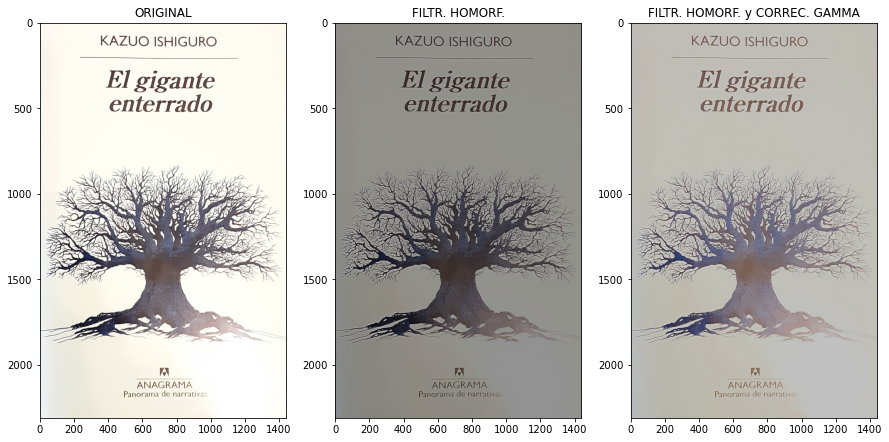

In [39]:
#filtrado
res_rgb_hm = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm.astype('uint8')]))

#filtrado y gamma
res_rgb_hm_gamma = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_hm_gamma.astype('uint8')]))

utils.plot([img, res_rgb_hm, res_rgb_hm_gamma], 
           figsize=(15,15), patron=(1,3), gray=False, 
           titulos=['ORIGINAL', 'FILTR. HOMORF.', 'FILTR. HOMORF. y CORREC. GAMMA'])

Al no tener una imagen ecualizada, donde se obtiene una mejora en el contraste de la misma, las demás técnicas no presentan los mismos resultados en comparación con la primera imagen tratada. Para imágenes sobresaturadas como la anterior, la recuperación del color es más complicada, ya que para compensar la sobre-iluminación, se pierde intensidad en los colores.

### Umbralizado Adaptativo

In [40]:
ret,th1 = cv.threshold(channel_v,220,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(channel_v,255,cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY,5,3)
th3 = cv.adaptiveThreshold(channel_v,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY,5,3)

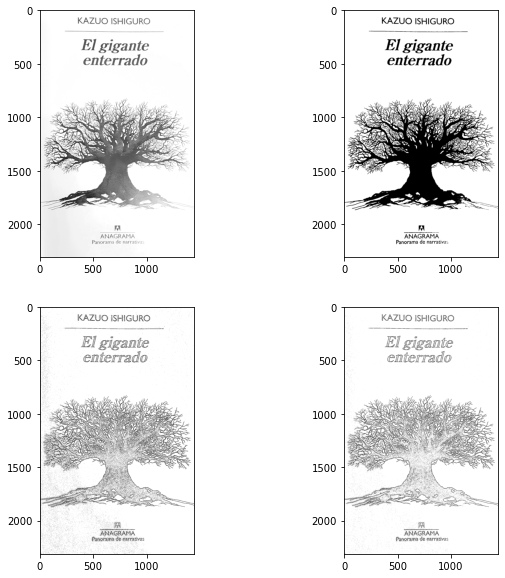

In [41]:
utils.plot([channel_v, th1, th2, th3], patron=(2,2))

Nuevamente, para el umbralizado adaptativo y constante, se observan los mismos fenómenos vistos en la imagen anterior. El primero de estos, por m´pas que consigue una mejor normalización de la iluminación, distorsiona en parte los colores y la textura de la imagen, algo que puede ser un problema dependiendo de lo que se busca obtener.

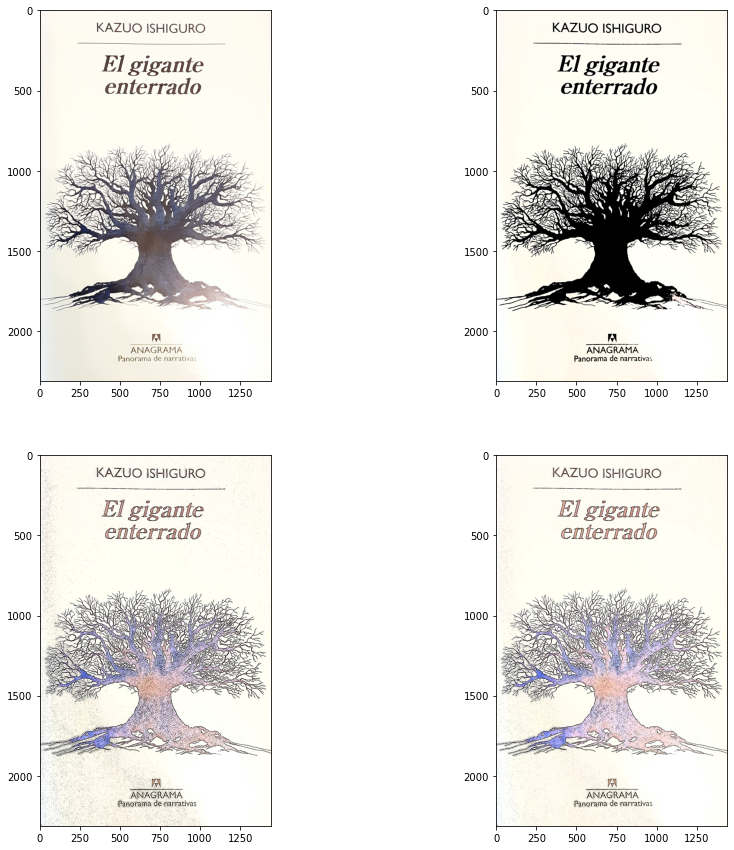

In [42]:
#filtrado
res_rgb_th1 = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], th1.astype('uint8')]))

#filtrado y gamma
res_rgb_th2 = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], th2.astype('uint8')]))

res_rgb_th3 = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], th3.astype('uint8')]))

utils.plot([img, res_rgb_th1, res_rgb_th2, res_rgb_th3], 
           figsize=(15,15), patron=(2,2), gray=False)

Un caso interesante es el de la siguiente imagen.  
A primera vista, parece una imagen totalmente negra, sin embargo, la misma tiene contenido de una portada.

In [43]:
img = images[11]

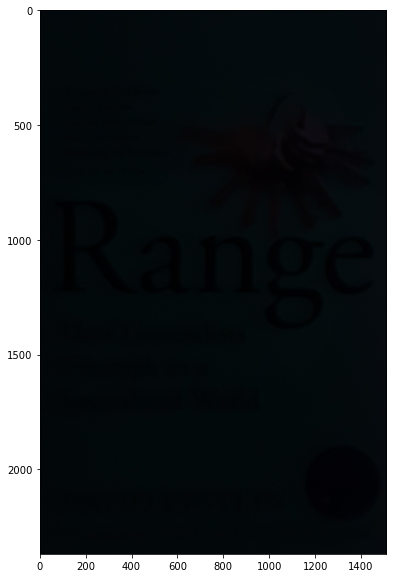

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(img)

Como se observa, la imagen contiene información relevante, solo que los niveles de grises son muy bajos, y de muy bajo contraste, por lo que el ojo humano no puede disintguir entre un nivel de intensidad y otro. Este fenómeno se puede ver en los histogramas siguientes.

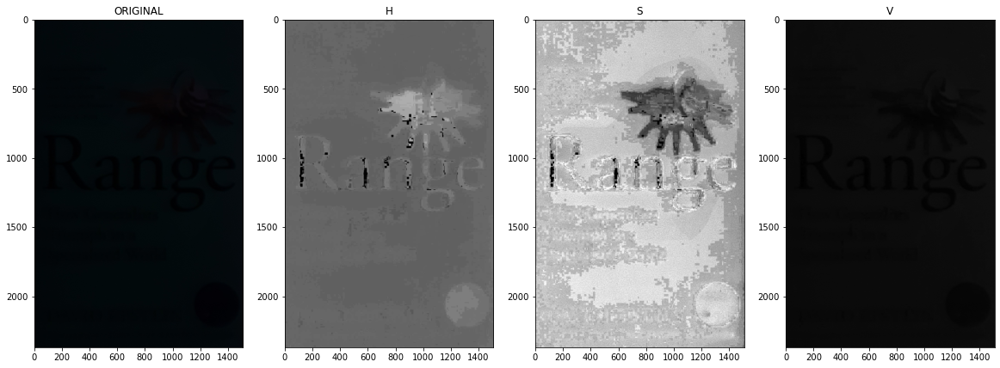

In [45]:
color.plot_color_channels(img, space='hsv')

In [46]:
channels_hsv = cv.split(color.RGB2HSV(img))

In [47]:
channel_v = channels_hsv[2]

In [48]:
channel_v_eqg = histo.eq_global(channel_v)
channel_v_eql = histo.eq_local(channel_v)

Acá se puede ver cómo ecualizar el histograma ayuda en obtener una iluminación uniforme a lo largo de las distintas intensidades de grises. Con un simple proceso pasamos de una imagen totalmente negra, a una imagen donde al menos podemos distinguir el nombre del libro y algunos otros detalles de la portada.  
Sin embargo, por las pobres condiciones iniciales, la recuperación de color o de detalles de la imagen se vuelven mas complicadas.

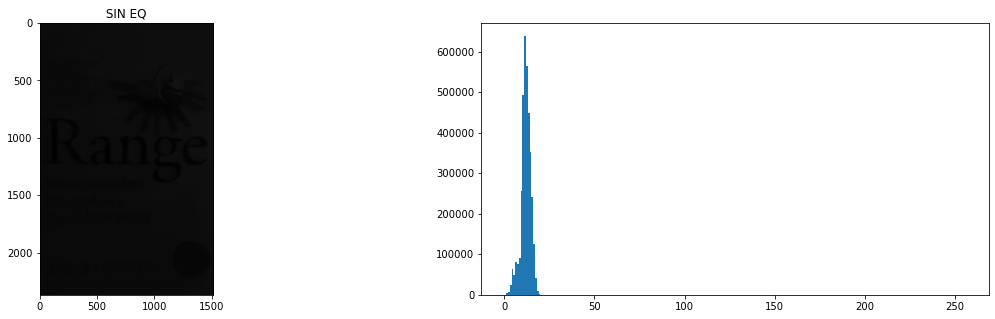

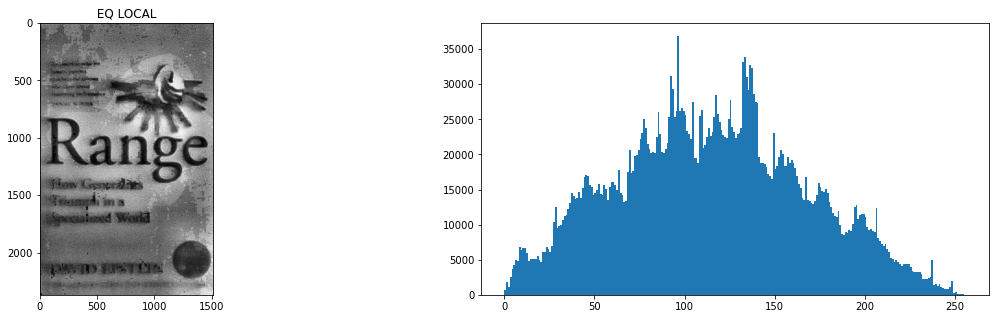

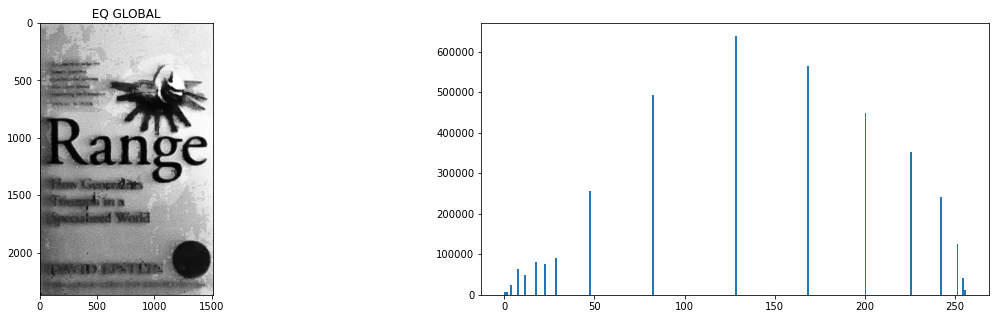

In [49]:
histo.plot_histo([channel_v], figsize=(20,5), patron=(1,2), titulos=[' SIN EQ ', ''])
histo.plot_histo([channel_v], eq='local', figsize=(20,5), patron=(1,2), titulos=[' EQ LOCAL ', ''])
histo.plot_histo([channel_v], eq='global', figsize=(20,5), patron=(1,2), titulos=[' EQ GLOBAL ', ''])

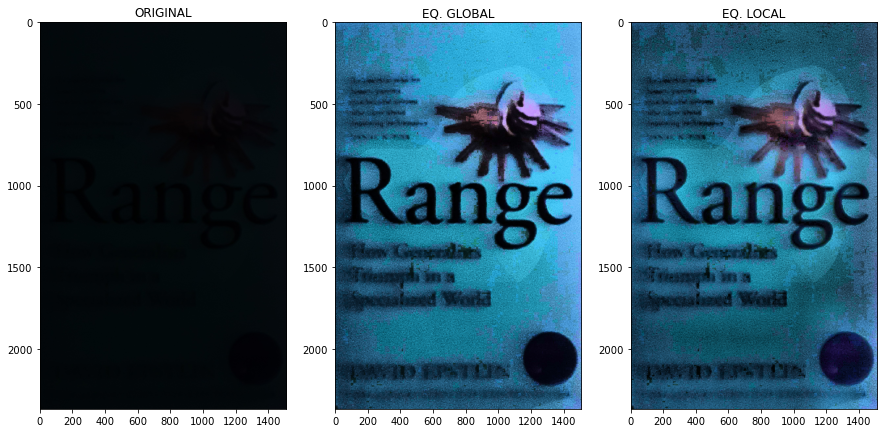

In [50]:
#filtrado
res_rgb_eqg = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_eqg.astype('uint8')]))

#filtrado y gamma
res_rgb_eql = color.HSV2RGB(cv.merge([channels_hsv[0], channels_hsv[1], channel_v_eql.astype('uint8')]))

utils.plot([img, res_rgb_eqg, res_rgb_eql], 
           figsize=(15,15), patron=(1,3), gray=False, 
           titulos=['ORIGINAL', 'EQ. GLOBAL', 'EQ. LOCAL'])

En comparación con el uso de umbralizados constante y adaptativo.

En este caso se puede ver como el umbralizado adaptativo tiene incovenientes para imágenes con una iluminación uniforme pero a la vez muy pobre. Es más dificil, en relación al umbralizado constante, encontrar los parámetros que generen resultados relativamente buenos, donde para el caso del constante, simplemente mirando el histograma, podemos encontrar un umbral que permita obtener ciertos resultados "*óptimos*".

In [51]:
ret,th1 = cv.threshold(channel_v,10,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(channel_v,255,cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY,7,1)
th3 = cv.adaptiveThreshold(channel_v,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY,7,1)

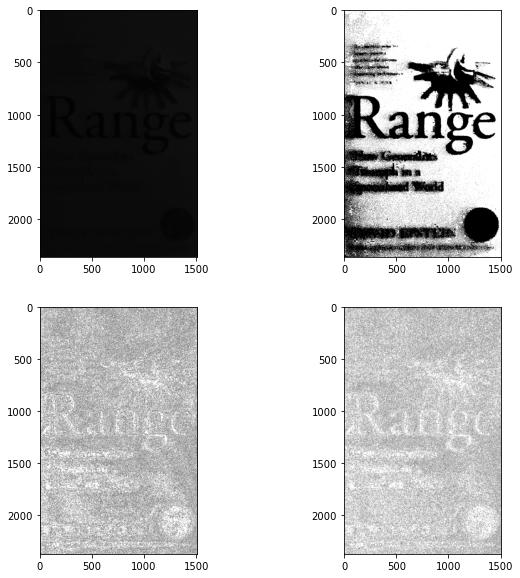

In [52]:
utils.plot([channel_v, th1, th2, th3], patron=(2,2))

## Conclusiones

Existen diversas técnicas, métodos y procedimientos que se pueden utilizar para la restauración o mejora de las imágenes. Sin embargo, el uso de cada una es altamente dependiente tanto de qué es lo que se espera obtener como resultado, las condiciones de obtención de las imágenes y de la complejidad delas mismas.  

Se vio como una ecualización, tanto global como local, puede generar buenos resultados siempre y cuando no se preseten casos donde exista una alta concecntración de energía en un reducido espacio del histograma.  

A su vez, el uso del filtrado homomórfico resultó de utilidad para conseguir una iluminación uniforme cuando la imagen no se encuentra sobresaturada, ya que nos permite modificar, de manera individual, los factores que solo afectan a la iluminación de la imagen.

Finalmente, los métodos de umbralizados son una herramienta muy útil para la obtención de una iluminación uniforme, sin embargo, para el caso del umbralizado adaptativo, la adición de ruido del método puede llevar a que no sea una técnica adecuada para ciertos casos.